<a href="https://colab.research.google.com/github/sanu1230/Academic-Project/blob/master/EDA_Case_Study_Wine_Quality_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EDA Case Study - Wine Quality Data

This case study is for EDA purpose only.

In [ ]:
!pip -q install pandas_profiling==2.5.0 

     |████████████████████████████████| 194kB 2.8MB/s 
     |████████████████████████████████| 10.4MB 11.3MB/s 
     |████████████████████████████████| 133kB 48.8MB/s 
     |████████████████████████████████| 614kB 47.9MB/s 
     |████████████████████████████████| 1.5MB 49.0MB/s 
     |████████████████████████████████| 61kB 7.5MB/s 
     |████████████████████████████████| 61kB 7.3MB/s 
     |████████████████████████████████| 256kB 47.8MB/s 
     |████████████████████████████████| 61kB 7.5MB/s 
     |████████████████████████████████| 327kB 48.0MB/s 
     |████████████████████████████████| 215kB 49.6MB/s 
     |████████████████████████████████| 51kB 6.5MB/s 
     |████████████████████████████████| 747kB 42.5MB/s 
     |████████████████████████████████| 61kB 238kB/s 
ERROR: google-colab 1.0.0 has requirement pandas~=1.0.0; python_version >= "3.0", but you'll have pandas 0.25.3 which is incompatible.
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.22.0

In [ ]:
!pip freeze | grep pandas

pandas==0.25.3
pandas-datareader==0.8.1
pandas-gbq==0.11.0
pandas-profiling==2.5.0
sklearn-pandas==1.8.0


## Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import pandas_profiling as pp
from IPython.display import HTML, display, IFrame
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")

## Loading Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
# Load Files
wd = pd.read_csv('/content/drive/My Drive/Colab Notebooks/EDA/Project Datasets/attachment_Project_3_Wine_Quality_data/Project_3_Wine Quality data/winequality.csv', 
                 encoding='utf-8', sep=';')
wd.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
wd.shape

(1599, 12)

**Observation:**

In [ ]:
wd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
fixed acidity           1599 non-null float64
volatile acidity        1599 non-null float64
citric acid             1599 non-null float64
residual sugar          1599 non-null float64
chlorides               1599 non-null float64
free sulfur dioxide     1599 non-null float64
total sulfur dioxide    1599 non-null float64
density                 1599 non-null float64
pH                      1599 non-null float64
sulphates               1599 non-null float64
alcohol                 1599 non-null float64
quality                 1599 non-null int64
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


**Observation:**
-  All the featrues data type is in float and int hence good for analysis

In [ ]:
wd.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


**Observation:**
- Summary looks good as there is no negative values in any feature. We also see that, intrestingly no wine has quality scores below 3 and above 8.

## Pandas Profiling

In [ ]:
report = pp.ProfileReport(wd)
report.to_file('winequality.html')

In [ ]:
display(HTML(open('winequality.html').read()))

Number of variables,12
Number of observations,1599
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,240
Duplicate rows (%),15.0%
Total size in memory,150.0 KiB
Average record size in memory,96.1 B
NUM,12
Analysis started,2020-07-07 10:10:45.979803
Analysis finished,2020-07-07 10:11:13.603909


**Observation:**
- citric acid has 132 zeros, some wine may not have citric acid, hence possible
- 240 Duplicate rows - Since in the give data there is no names of the wine brand, instead we just have index number. It is possible that various wine brands have same amount of features in it. Since this data looks 2nd case hence we do not know how this data was take and hence will keep all the duplicates.
- Wines usually have red wine and white wine and the quality range is different for both, the red wine quality range is [3,8] and for white wine the quality range is [3,9], hence this seems to be red wine data only

## Visual Findings

### Number of examples with each quality target value

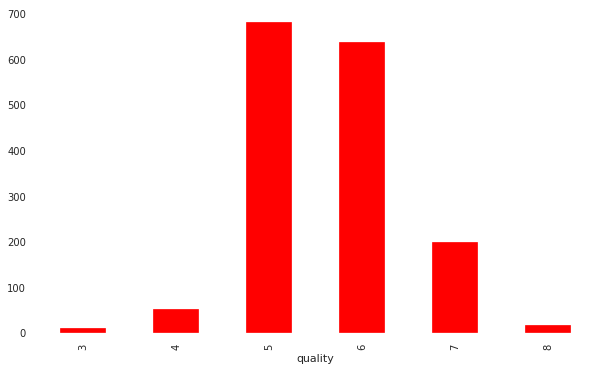

In [ ]:
#Number of examples with each quality target value

plt.figure(figsize=(10,6))
wd.groupby('quality').size().plot(kind='bar', color='r')

**Observation**
- The maximum examples are of quality target mean i.e 5 & 6 which seems to be guassian distribution and with low variance since trget value below 3 and above 8 is not existant. This will effect out future analysis, hence will be hard to predict any targets.

### Correlation Matrix

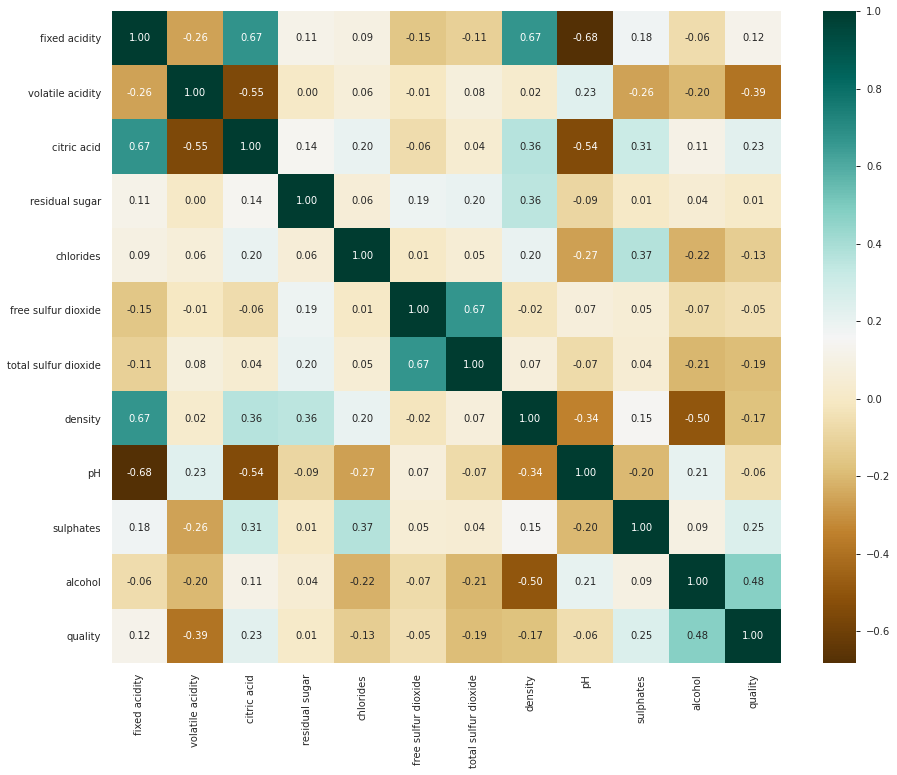

In [ ]:
corr = wd.corr()

plt.figure(figsize=(15, 12))
sns.heatmap(corr, annot=True, cmap='BrBG', fmt='.2f')

In [ ]:
# Correlation
threshhold = 0.65

col_names = wd.columns

for x in col_names:
  for y in col_names:
    if (y > x):
      if abs(corr[y][x]) > threshhold:
        print(x + ' : ' + y + ' : ' + str(corr[x][y]))

fixed acidity : pH : -0.6829781945685299
citric acid : fixed acidity : 0.6717034347641041
free sulfur dioxide : total sulfur dioxide : 0.6676664504810212
density : fixed acidity : 0.6680472921189711


**Observation:**

**With Threshhold as 0.65** We see high correlation between:-
- fixed_acidity & pH is -68
- fixed_acidity & citric acid
- free sulfur dioxide & total sulfur dioxide

In [ ]:
wd.columns = wd.columns.str.replace(' ', '_')
wd.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

### Correlation between fixed_acidity & pH level & citric_acid

In [ ]:
plt.figure(figsize=(10, 8))
px.scatter(data_frame=wd, x='fixed_acidity', y='pH', size='citric_acid', color='quality')

<Figure size 720x576 with 0 Axes>

**Obsdrvation**
- The pH level decereses as an when the fixed_acidity & citric_acid increases. and 

### Pair Plotting Features


In [ ]:
plt.figure(figsize=(15,15))
px.scatter_matrix(wd, color='quality')

<Figure size 1080x1080 with 0 Axes>

### Fixed acidity Vs Volatile acidity

In [ ]:
plt.figure(figsize=(10,6))
# wd1 = wd.groupby('quality').count()
px.scatter(data_frame=wd, x='fixed_acidity', y='volatile_acidity', color='quality',
                size='density')

<Figure size 720x432 with 0 Axes>

**Observation**
- There isn't any linear correlation between the increase of fixed and volatile acidity

### citric_acid ~ pH

<Figure size 720x432 with 0 Axes>

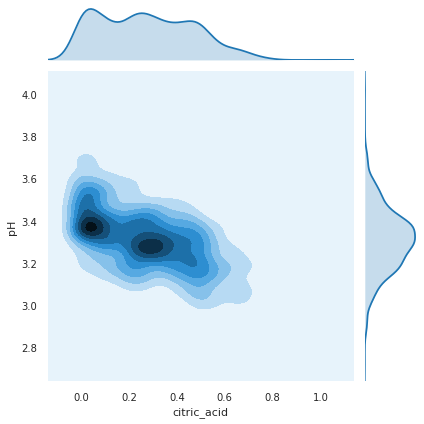

In [ ]:
plt.figure(figsize=(10, 6))
sns.jointplot(data=wd, x='citric_acid', y='pH', color='C0', kind='kde' )

### Distribution comparision of Features

In [ ]:
wd.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

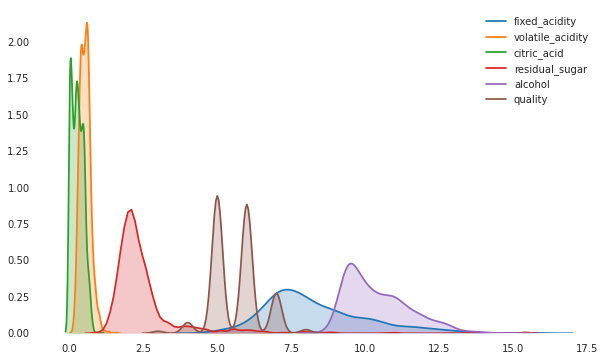

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=wd.fixed_acidity, label='fixed_acidity', shade=True)
sns.kdeplot(data=wd.volatile_acidity, label='volatile_acidity', shade=True)
sns.kdeplot(data=wd.citric_acid, label='citric_acid', shade=True)
sns.kdeplot(data=wd.residual_sugar, label='residual_sugar', shade=True)
sns.kdeplot(data=wd.alcohol, label='alcohol', shade=True)
sns.kdeplot(data=wd.quality, label='quality', shade=True)



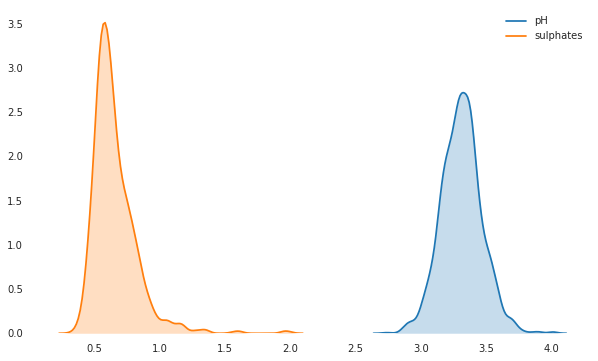

In [ ]:
plt.figure(figsize=(10, 6))

sns.kdeplot(data=wd.pH, label='pH', shade=True)
sns.kdeplot(data=wd.sulphates, label='sulphates', shade=True)


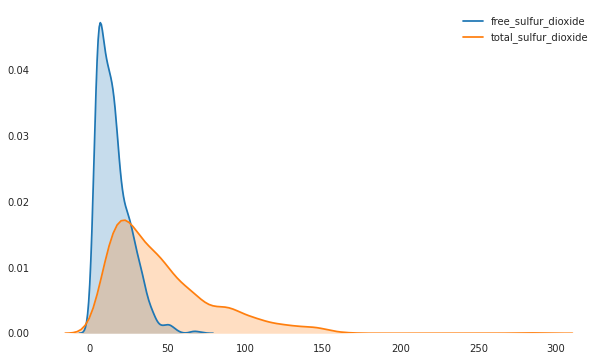

In [ ]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=wd.free_sulfur_dioxide, label='free_sulfur_dioxide', shade=True)
sns.kdeplot(data=wd.total_sulfur_dioxide, label='total_sulfur_dioxide', shade=True)


## **Observation**

- Quality has most values concentrated in the categories 5, 6 and 7. Only a small proportion is in the categories [3, 4] and [7, 8] and none in the categories [1, 2] and 10.
- Fixed acidity, volatile acidity and citric acid have outliers. If those outliers are eliminated distribution of the variables may be taken to be symmetric.
- Residual sugar has a positively skewed distribution; even after eliminating the outliers distribution will remain skewed.
- Some of the variables, e.g . free sulphur dioxide, density, have a few outliers but these are very different from the rest.
- Mostly outliers are on the larger side.
- Alcohol has an irregular shaped distribution but it does not have pronounced outliers.
